# Intro
This project aims to build and audio autoencoder for audio compression.

It will contain the following blocks:

Audio (10 s) -> DFT transform -> Encoder -> (latent space) -> Decoder -> iDFT transform -> Recovered audio

Data extracted from here:
https://zenodo.org/record/1101082#.Y4YvSuzMI-R

# Data

We have built our own dataset using the notebook <a src="./Preparing-Data.ipynb">Preparing-Data.ipynb</a>. In short, it builds a CSV file that contains the information of 10 seconds chunks of the original data. The CSV has the following form:
<div style="width:100%">
  <table style="margin:auto">
    <tr>
      <th>name</th>
      <th>start_time</th>
      <th>end_time</th>
    </tr>
    <tr>
      <td>audio_1</td>
      <td>0</td>
      <td>10</td>
    </tr>
    <tr>
      <td>audio_1</td>
      <td>10</td>
      <td>20</td>
    </tr>
    <tr>
      <td>audio_1</td>
      <td>20</td>
      <td>30</td>
    </tr>
    <tr>
      <td>audio_2</td>
      <td>0</td>
      <td>10</td>
    </tr>
    <tr>
      <td>audio_2</td>
      <td>10</td>
      <td>20</td>
    </tr>
    <tr>
      <td>audio_2</td>
      <td>20</td>
      <td>30</td>
    </tr>
    <tr>
      <td colspan="3" style="text-align:center">...</td>
    </tr>
  </table>
</div>

We create three tables like this:
1. Training 60% $\rightarrow$ 9797 chunks
2. Validation: 20% $\rightarrow$ 3266 chunks
3. Testing: 20% $\rightarrow$ 3266 chunks


# Setup

In [2]:
import pathlib
base_path = pathlib.Path("../")

In [3]:
import numpy as np
from IPython.display import Audio
import pathlib
import torchsummary
import torch
import torch.nn as nn
import torchvision.transforms as transforms
import essentia.standard as es
import pandas as pd
import datetime
import matplotlib.pyplot as plt
import os
import json
import sys
sys.path.append(str(base_path))

[   INFO   ] MusicExtractorSVM: no classifier models were configured by default


In [4]:
data_path = pathlib.Path('../audio/')
results_path = pathlib.Path('../results/')
models_path = pathlib.Path('../models/')

In [5]:
# Checking if gpu available
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')

# DFT

In [6]:
def compute_spectrogram(x, fft_size=1024, hop_size=1024, window_type='square'):
    """ Gets the spectrogram of waveform x
    
    Args:
        x (numpy.array): Array of samples
        fft_size (int): FFT size
        hop_size (int): Hop size between windows
        window_type (str): Window type (e.g. 'square' or 'hann')

    Returns:
        (np.array): Spectrogram with shape (num_frames, fft_size / 2 + 1) 
    """
    w = es.Windowing(type=window_type)
    fft = es.FFT()
    spectrogram = []
    for frame in es.FrameGenerator(x,
                                   frameSize=fft_size,
                                   hopSize=hop_size,
                                   startFromZero=True):
        windowed_frame = w(frame)
        fft_windowed_frame = fft(windowed_frame)
        spectrogram.append(fft_windowed_frame)
    spectrogram = np.array(spectrogram)

    # We do this to use the full dynamic range before quantization:
    spectrogram /= np.max(np.abs(spectrogram))

    return spectrogram

In [7]:
def compute_inverse_spectrogram(X, fft_size=1024, hop_size=1024):
    """ Gets the waveform from a spectrogram X
    
    Args:
        x (numpy.array): Array of samples
        fft_size (int): FFT size
        hop_size (int): Hop size between windows
        window_type (str): Window type (e.g. 'square' or 'hann')

    Returns:
        (np.array): Spectrogram with shape (num_frames, fft_size / 2 + 1) 
    """
    overlap_add = es.OverlapAdd(frameSize=fft_size, hopSize=hop_size)
    ifft = es.IFFT()
    y = np.array([], dtype=np.float32)
    for fft_windowed_frame in X:
        windowed_frame = ifft(fft_windowed_frame)
        frame_overlapped = overlap_add(windowed_frame)
        y = np.append(y, frame_overlapped)
    return y

# Data
Here we define a custom data loader to load the data at training time.

This dataloader is fed with a CSV (train, val or test). When requesting for a single item with the __getitem__() function, it will 
1. Read a row in the CSV 
2. Load the audio
3. Compute the DFT of the audio
4. Extract the real and imaginary parts of the DFT in two matrices
5. Combine the real and imaginary matrices in the third dimension. In other words, the resulting data will be of shape [bins, frames, channels], where bins is the number of frequency bins, frames in the number of frames of the audio and the channels contain the real and imaginary parts.

In [8]:
class AudioDB(torch.utils.data.Dataset):
    # Initialization method for the dataset
    def __init__(self, data_filename, 
                 data_path,
                 transform = None,
                 fs = 44100,
                 fft_size=1024,
                 hop_size=1024, 
                 window_type='square'):
        self.audio_df = pd.read_csv(data_filename, sep=";")
        self.audio_df = self.audio_df.sample(frac=1, 
                                             ignore_index=True)

        self.data_path = data_path
        self.transform = transform
        self.fs = fs
        self.fft_size = fft_size
        self.hop_size = hop_size
        self.window_type = window_type

    # What to do to load a single item in the dataset
    def __getitem__(self, index):
        sample_data = self.audio_df.iloc[index]

        f = self.data_path / sample_data["name"]
        start_time = int(sample_data["start_time"])
        end_time = int(sample_data["end_time"])
        
        audio_data = es.EasyLoader(filename=str(f),
                                   sampleRate=self.fs,
                                   startTime=start_time, 
                                   endTime=end_time)()
        
        dft = compute_spectrogram(audio_data,
                                  self.fft_size,
                                  self.hop_size,
                                  self.window_type)

        magnitud = np.abs(dft).T
        phase = np.angle(dft, 
                         deg=False).T

        data = np.array([magnitud,
                        phase])
        
        # get shape [bins, frames, channels]
        # where frames are audio frames, bins are the frequency bins
        # and channels refer to magnitud and phase.
        data = np.moveaxis(data, 0, 2)
        
        if self.transform is not None : 
            data = self.transform(data)

        return data

    # Return the number of dfts
    def __len__(self):
        return len(self.audio_df)


tr = transforms.Compose([
        transforms.ToTensor(), 
        ])

data_filename = data_path / "audio_chunks.csv"

batch_size = 100
audios_db = AudioDB(data_filename,
                   data_path,
                   tr)

train_loader = torch.utils.data.DataLoader(dataset=audios_db,
                                           batch_size=batch_size, 
                                           shuffle=True)

# Mini-batch images
#audios = next(iter(train_loader))
#print(audios.shape)

# Convert batch to audios

The following functions are useful to convert from a DFT to audio

In [9]:
def polar_2_rectangular(magnitude, phase):
    """Convert from a complex number from polar form \
        to rectangular form (i.e., a + b*j)-

    Args:
        magnitude (float): magnitude of the complex number
        phase (float): angle in radians of the complex number

    Returns:
        _type_: _description_
    """
    return magnitude * np.exp(1j*phase)

In [10]:
def batch_dft_to_audio(batch: torch.Tensor,
                       fft_size=1024, 
                       hop_size=1024,
                       listen=False,
                       sr = 44100) -> list:
    """Convert a batch of DFT in polar forma to audio signal

    Args:
        batch (torch.Tensor): batch of dfts in the form [B, C, FB, FR] \
            where B is the batch size; C is the number of channels \
            (in this case, the first channel is for the magnitude, \
            and the second channel, for the phase); FB is the number \
            of frequency bins and; FR is the number of frames.
        fft_size (int, optional): Size of the DFT. Defaults to 1024.
        hop_size (int, optional): Hop size of the DFT. Defaults to 1024.
        listen (boolean, optional): It displays a player to reproduce all \
            the audios in the batch.
        sr (int, optional): Sampling rate to reproduce the audio when \
            listen==True. 
    Return:
        A list of all the audios.
    """
    batch_np = batch.permute(0,2,3,1).detach().numpy()
    
    audios = list()
    
    for _b in batch_np:
        magnitude = _b[:, :, 0].T
        phase = _b[:, :, 1].T
        
        dft = polar_2_rectangular(magnitude,
                                  phase)
        
        audio = compute_inverse_spectrogram(dft, 
                                            fft_size=fft_size,
                                            hop_size=hop_size)
        
        audios.append(audio)
        
        if listen:
            display(Audio(audio, rate=44100))
    
    return audios

# Audio Autoencoder
In this section, we will define the Audio Autoencoder we will be training.

## Base layers
The Encoder is built on top of convolutional layers with batch normalization and ReLU. The Decoder, is built on top of tranposed convolutions, batch normalization and ReLU activation and Tanh activations.

In this section, we show their implementation.

In [11]:
# Convolution + BatchNormnalization + ReLU or Tanh block for the encoder
class ConvBNReLU(nn.Module):
  def __init__(self,in_channels, out_channels, activation: str = "relu"):
    super(ConvBNReLU, self).__init__()
    self.conv = nn.Conv2d(in_channels,out_channels,kernel_size=3,
                          padding = 1)
    self.bn = nn.BatchNorm2d(out_channels)

    if activation.lower() == "relu":
      self.activation = nn.ReLU(inplace=True)
    elif activation.lower() == "tanh":
      self.activation = nn.Tanh()
    else:
      raise Exception("Activations available are: relu or tanh")

  def forward(self,x):
    out = self.conv(x)
    out = self.bn(out)
    out = self.activation(out)   
    return out


# Downsampling Convolution + BatchNormnalization + ReLU block for the encoder
class DownsamplinConvBNReLU(nn.Module):
  def __init__(self,in_channels, out_channels):
    super(DownsamplinConvBNReLU, self).__init__()
    self.conv = nn.Conv2d(in_channels,out_channels,kernel_size=3,
                          stride= 2, padding = 1)
    self.bn = nn.BatchNorm2d(out_channels)
    self.relu = nn.ReLU(inplace=True)

  def forward(self,x):
    out = self.conv(x)
    out = self.bn(out)
    out = self.relu(out)   
    return out

# Upsampling Convolution (Deconvolution) + 
# BatchNormnalization + ReLU block for the encoder
class UpsamplinConvBNReLU(nn.Module):
  def __init__(self,in_channels, out_channels, output_padding: list):
    super(UpsamplinConvBNReLU, self).__init__()
    self.deconv = nn.ConvTranspose2d(in_channels,
                                     out_channels,
                                     kernel_size=3,
                                     stride= 2, 
                                     padding = 1, 
                                     output_padding = output_padding)
    self.bn = nn.BatchNorm2d(out_channels)
    self.relu = nn.ReLU(inplace=True)

  def forward(self,x):
    out = self.deconv(x)
    out = self.bn(out)
    out = self.relu(out)   
    return out

## Encoder

The encoder has the following architecture:

<img src="../figures/Encoder.png">


In [12]:
class Encoder(nn.Module):
  def __init__(self, input_channels = 1, base_channels=32, out_features = 400):
    super(Encoder, self).__init__()

    self.layer1 = ConvBNReLU(input_channels, 
                             base_channels)
    
    self.layer2 = DownsamplinConvBNReLU(base_channels, 
                                        base_channels*2)
    
    self.layer3 = DownsamplinConvBNReLU(base_channels*2,
                                        base_channels*4)
    
    self.layer4 = DownsamplinConvBNReLU(base_channels*4,
                                        base_channels*8)
    
    self.layer5 = DownsamplinConvBNReLU(base_channels*8,
                                        base_channels*16)
    
    self.layer6 = DownsamplinConvBNReLU(base_channels*16,
                                        base_channels*32)

    fc_input_size = 14 * 17 * base_channels*32 # Hardcoded for input of (431 x 513)
    self.fc = nn.Linear(fc_input_size, out_features)
  
  def forward(self,x):
    out = self.layer1(x)
    out = self.layer2(out)
    out = self.layer3(out)
    out = self.layer4(out)
    out = self.layer5(out)
    out = self.layer6(out)

    return self.fc(out.view(x.shape[0],-1))


In [13]:
encoder = Encoder(2, 32, 400).to(device)

torchsummary.summary(encoder, input_size=(2, 513, 431))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 32, 513, 431]             608
       BatchNorm2d-2         [-1, 32, 513, 431]              64
              ReLU-3         [-1, 32, 513, 431]               0
        ConvBNReLU-4         [-1, 32, 513, 431]               0
            Conv2d-5         [-1, 64, 257, 216]          18,496
       BatchNorm2d-6         [-1, 64, 257, 216]             128
              ReLU-7         [-1, 64, 257, 216]               0
DownsamplinConvBNReLU-8         [-1, 64, 257, 216]               0
            Conv2d-9        [-1, 128, 129, 108]          73,856
      BatchNorm2d-10        [-1, 128, 129, 108]             256
             ReLU-11        [-1, 128, 129, 108]               0
DownsamplinConvBNReLU-12        [-1, 128, 129, 108]               0
           Conv2d-13          [-1, 256, 65, 54]         295,168
      BatchNorm2d-14          [-

## Decoder
The architecture of the decoder is:

<img src="../figures/Decoder.png">


In [14]:
class Decoder(nn.Module):
  def __init__(self, out_channels = 1, 
               base_channels=32,
               input_features = 400):
    super(Decoder, self).__init__()

    fc_input_size = 14 * 17 * base_channels*32 # Hardcoded for input of (431 x 513)
    self.fc = nn.Linear(input_features, 
                        fc_input_size)

    self.layer6 = UpsamplinConvBNReLU(base_channels*32,
                                      base_channels*16,
                                      [0, 0])

    self.layer5 = UpsamplinConvBNReLU(base_channels*16,
                                      base_channels*8,
                                      [0, 1])

    self.layer4 = UpsamplinConvBNReLU(base_channels*8,
                                      base_channels*4,
                                      [0, 1])

    self.layer3 = UpsamplinConvBNReLU(base_channels*4,
                                      base_channels*2,
                                      [0, 1])

    self.layer2 = UpsamplinConvBNReLU(base_channels*2,
                                      base_channels,
                                      [0, 0])

    self.layer1 = ConvBNReLU(base_channels, 
                             out_channels, 
                             activation = "tanh")
    
    self.base_channels = base_channels
    
  
  def forward(self,x):
    out = self.fc(x)
    out = out.view(x.shape[0],
                   self.base_channels*32,
                   17,
                   14) # Hardcoded for input of (431 x 513)
    out = self.layer6(out)
    out = self.layer5(out)
    out = self.layer4(out)
    out = self.layer3(out)
    out = self.layer2(out)
    out = self.layer1(out)
    return out

In [15]:
decoder = Decoder(2, 32, 400).to(device)

torchsummary.summary(decoder, input_size=(1, 400))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Linear-1            [-1, 1, 243712]      97,728,512
   ConvTranspose2d-2          [-1, 512, 33, 27]       4,719,104
       BatchNorm2d-3          [-1, 512, 33, 27]           1,024
              ReLU-4          [-1, 512, 33, 27]               0
UpsamplinConvBNReLU-5          [-1, 512, 33, 27]               0
   ConvTranspose2d-6          [-1, 256, 65, 54]       1,179,904
       BatchNorm2d-7          [-1, 256, 65, 54]             512
              ReLU-8          [-1, 256, 65, 54]               0
UpsamplinConvBNReLU-9          [-1, 256, 65, 54]               0
  ConvTranspose2d-10        [-1, 128, 129, 108]         295,040
      BatchNorm2d-11        [-1, 128, 129, 108]             256
             ReLU-12        [-1, 128, 129, 108]               0
UpsamplinConvBNReLU-13        [-1, 128, 129, 108]               0
  ConvTranspose2d-14         [-1, 6

## Audio Autoencoder
Then, the architecture of the autoencoder is the combination of both the Encoder and the Decoder:

<img src="../figures/Autoencoder.png">

In [16]:
class AudioAutoEncoder(nn.Module):
    def __init__(self, input_channels, base_channels, num_features):
        super(AudioAutoEncoder, self).__init__()
        # Initialize the encoder and decoder using a dimensionality out_features for the vector z
        self.encoder = Encoder(input_channels, base_channels, num_features)
        self.decoder = Decoder(input_channels, base_channels, num_features)


    def encode(self,x):
        return self.encoder(x)

    def forward(self,x):
        encode = self.encoder(x)
        decode = self.decoder(encode)
        return decode

In [17]:
autoencoder = AudioAutoEncoder(2, 32, 400).to(device)
torchsummary.summary(autoencoder, input_size=(2, 513, 431))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 32, 513, 431]             608
       BatchNorm2d-2         [-1, 32, 513, 431]              64
              ReLU-3         [-1, 32, 513, 431]               0
        ConvBNReLU-4         [-1, 32, 513, 431]               0
            Conv2d-5         [-1, 64, 257, 216]          18,496
       BatchNorm2d-6         [-1, 64, 257, 216]             128
              ReLU-7         [-1, 64, 257, 216]               0
DownsamplinConvBNReLU-8         [-1, 64, 257, 216]               0
            Conv2d-9        [-1, 128, 129, 108]          73,856
      BatchNorm2d-10        [-1, 128, 129, 108]             256
             ReLU-11        [-1, 128, 129, 108]               0
DownsamplinConvBNReLU-12        [-1, 128, 129, 108]               0
           Conv2d-13          [-1, 256, 65, 54]         295,168
      BatchNorm2d-14          [-

# Training function

For training, we have used the following loss function

$$L(x,\hat x) = MSE + \lambda L_1$$
$$L(x,\hat x) = \frac{1}{N}\sum^N (x - \hat x)^2 + \lambda \frac{1}{N}|x - \hat x|$$

In the implementation, $N$ is the batch size.

This loss function has been inspired from this <a src="https://onlinelibrary.wiley.com/doi/abs/10.1002/int.22726">paper</a> and from our <a src="https://docs.google.com/presentation/d/1oPVnEt_ZPnpG45wtop0wDt93CqpTtS2npGGJYVR_mws/edit#slide=id.g1332ada67c8_3_0">previous project</a> on the DL course.

In [18]:
import torch.nn as nn
import torch
import numpy as np
from src.utils.utils import batch_dft_to_audio



def train_autoencoder(autoencoder, train_loader, optimizer,
              model_name, models_path, num_epochs=10,
              device='cpu', lbmda = 0.5, losses_list = None):
    autoencoder = autoencoder.to(device)
    autoencoder.train() # Set the generator in train mode

    total_step = len(train_loader)
    
    if losses_list == None:
        losses_list = []

    l1_loss = nn.L1Loss()
    mse_loss = nn.MSELoss()

    # Iterate over epochs
    for epoch in range(num_epochs):
        # Iterate the dataset
        loss_sum = 0
        n_batches = 0

        for i, dfts in enumerate(train_loader):
            # Get batch of samples and labels
            dfts_device = dfts.to(device)
            
            # Forward pass
            # Generate random images with the generator
            synth_dfts = autoencoder.forward(dfts_device)
            
            # Generator loss
            cur_l1_loss = lbmda * l1_loss(synth_dfts, dfts_device)
            cur_mse_loss = mse_loss(synth_dfts, dfts_device)

            autoencoder_loss = cur_mse_loss + cur_l1_loss

            optimizer.zero_grad()
            autoencoder_loss.backward() # Necessary to not erase intermediate variables needed for computing disc_loss gradient
            optimizer.step()
                
            loss_sum += autoencoder_loss.cpu().item()

            n_batches += 1

            if (i+1) % 100 == 0:
                print(f"Epoch [{epoch+1}/{num_epochs}]. "
                      f"Step [{i+1}/{total_step}]. "
                      f"Loss: {round(loss_sum/n_batches, 5)}.")
                # Listen batch
                _ = batch_dft_to_audio(synth_dfts, listen=True)
        
        loss_avg = loss_sum/n_batches
        print(f"Epoch [{epoch+1}/{num_epochs}]. "
              f"Step [{i+1}/{total_step}]. "
              f"Loss: {round(loss_avg, 5)}.")
        
        # Save model        
        model_checkpoint_filename = models_path / f"{model_name}__epoch_{epoch}.ckpt"
        torch.save(autoencoder.state_dict(),
                   model_checkpoint_filename)
        # Save model loss
        model_loss_filename = models_path / f"{model_name}__epoch_{epoch}_loss.npy"
        losses_list.append(loss_avg)
        np.save(model_loss_filename, np.array(losses_list))
        
    # Save final model
    model_filename = models_path / f"{model_name}__final.ckpt"
    torch.save(autoencoder.state_dict(),
                model_filename)
    # Save loss history
    model_loss_filename = models_path / f"{model_name}__final_loss.npy"
    np.save(model_loss_filename, np.array(losses_list))
    
          
    return model_filename, model_loss_filename, losses_list


# Training

In [19]:
# DataLoader
tr = transforms.Compose([
        transforms.ToTensor(), 
        ])

data_filename = data_path / "train_data.csv"

batch_size = 60
train_audios_db = AudioDB(data_filename,
                   data_path,
                   tr)

num_workers = 8

train_loader = torch.utils.data.DataLoader(dataset=train_audios_db,
                                           batch_size=batch_size, 
                                           shuffle=True,
                                           num_workers = num_workers)

In [20]:
len(train_audios_db)

9797

In [ ]:
autoencoder = AudioAutoEncoder(2, 32, 400)

#Initialize indepdent optimizer for both networks
learning_rate = .001
weight_decay = 1e-5
optimizer = torch.optim.Adam(autoencoder.parameters(),
                             lr=learning_rate, 
                             weight_decay=weight_decay)
lbmda = 0.5

num_epochs = 60


In [ ]:
model_timestamp = datetime.datetime.today().strftime("%d-%m-%Y_%H-%M")
os.mkdir(models_path / model_timestamp)
model_name = f"{model_timestamp}/model"
model_hyperparams_filename = models_path / model_timestamp / "hyperparams.json"

print(model_name)

09-12-2022_17-52/model


In [ ]:
# Save hyperparms
params_dict = {
    "learning_rate": learning_rate,
    "weight_decay": weight_decay,
    "optimizer": str(optimizer.__class__),
    "lambda": lbmda,
    "target_num_epochs": num_epochs
}

with open(model_hyperparams_filename, "w") as f:
    json.dump(params_dict, f, indent=4)

In [ ]:
model_filename, model_loss_filename, losses_list = train_autoencoder(autoencoder, 
                                                                     train_loader,
                                                                     optimizer,
                                                                     model_name,
                                                                     models_path,
                                                                     num_epochs,
                                                                     device,
                                                                     lbmda)

## Resume training
To resume the training, you may use the <a src="./Resume-Training.ipynb">Resume-Training.ipynb</a> notebook.

## Training loss

In [ ]:
model_loss_filename = models_path / f"{model_name}__final_loss.npy"
losses_list = np.load(model_loss_filename)

plt.title("Training Loss")
plt.plot(range(1, num_epochs + 1), losses_list)
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.show()

# Testing

In [ ]:
# DataLoader
tr = transforms.Compose([
        transforms.ToTensor(), 
        ])

data_filename = data_path / "test_data.csv"

batch_size = 10
test_audios_db = AudioDB(data_filename,
                   data_path,
                   tr)

num_workers = 8

test_loader = torch.utils.data.DataLoader(dataset=test_audios_db,
                                           batch_size=batch_size, 
                                           shuffle=True,
                                           num_workers = num_workers)

In [ ]:
model_filename = models_path / "09-12-2022_01-12" / "model__epoch_3.ckpt"
model_loss_filename = models_path / "09-12-2022_01-12" / "model__epoch_3_loss.npy"

trained_model_dict = torch.load(model_filename)

trained_model = AudioAutoEncoder(2, 32, 400)
trained_model.load_state_dict(trained_model_dict)
trained_model = trained_model.to(device)

In [ ]:
test_synth = trained_model(next(iter(test_loader)))

audios = batch_dft_to_audio(test_synth, listen=True)

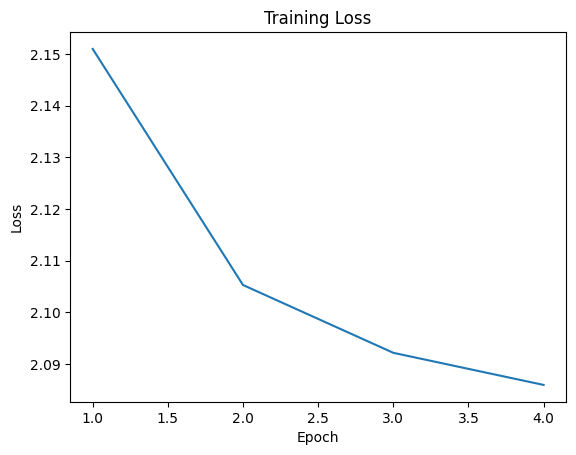

In [ ]:
losses_list = np.load(model_loss_filename)

plt.title("Training Loss")
plt.plot(range(1,len(losses_list)+1), losses_list)
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.show()